# **ENEE3309 Final Project**

## 1)**Clone .wav Files**

In [ ]:
!rm -rf ./ENEE3309-2-2022 #delete file if exist 
!git clone https://github.com/mkjubran/ENEE3309-2-2022.git #clone Repo.

Cloning into 'ENEE3309-2-2022'...
remote: Enumerating objects: 55, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 55 (delta 3), reused 5 (delta 1), pack-reused 47
Unpacking objects: 100% (55/55), done.


## 2)**Import required libraries**

In [ ]:
import wave 
import numpy as np 
import matplotlib.pyplot as plt 
import random 
import scipy 
import struct 
import pylab
import pdb
from scipy.io import wavfile

## 3)**use FDMAMixer to mix .wav files**

### 3.1)declare some function 

In [ ]:
#Upsampler function
def upsampler(input_signal, upsamplerate):
   L=input_signal.shape[0]
   return np.reshape(np.transpose(np.ones([upsamplerate,1])*input_signal),[upsamplerate*L])

#Downsampler function
def downsampler(input_signal, downsamplerate):
   L=input_signal.shape[0]
   return input_signal[0::downsamplerate]

#Plot signal in the time and frequency domain function
def plotTimeFreq(y, Fs, BWrange):
  n = len(y) # length of the signal
  k = np.arange(n)
  T = n/Fs
  
  t = np.arange(0,n*Ts,Ts) # time vector

  frq = k/T # two sides frequency range
  fcen=frq[int(len(frq)/2)]
  frq_DS=frq-fcen
  frq_SS = frq[range(int(n/2))] # one side frequency range

  Y = np.fft.fft(y) # fft computing and normalization
  yinv= np.fft.ifft(Y).real # ifft computing and normalization
  Y_DS=np.roll(Y,int(n/2))
  Y_SS = Y[range(int(n/2))]

  fcenIndex = (np.abs(frq_DS)).argmin()
  RangeIndex = (np.abs(frq_DS-BWrange)).argmin() - fcenIndex

  RangeIndexMin = fcenIndex-RangeIndex
  if RangeIndexMin < 0:
    RangeIndexMin = 0

  RangeIndexMax = fcenIndex+RangeIndex
  if RangeIndexMax > len(frq_DS)-1:
    RangeIndexMax = len(frq_DS)-1

  ## uncomment to plot !
  '''
  fig, ax = plt.subplots(2, 1,  figsize=(16, 6))
  ax[0].plot(t,y)
  ax[0].set_xlabel('Time')
  ax[0].set_ylabel('Amplitude')
  ax[1].set_xlabel('Freq (Hz)')
  ax[1].set_ylabel('|Y(freq)|')
  ax[1].plot(frq_DS[RangeIndexMin:RangeIndexMax],abs(Y_DS[RangeIndexMin:RangeIndexMax]),'r') # plotting the spectrum
  ax[1].set_xlabel('Freq (Hz)')
  ax[1].set_ylabel('|Y(freq)|')
  '''
  return yinv

### 3.2)read files and mixxing them and save the result file

In [ ]:
filenameWave1 = '/content/ENEE3309-2-2022/SunnyDayFilteredBW3000.wav'
filenameWave2 = '/content/ENEE3309-2-2022/Athan1FilteredBW3000.wav'
filenameWave3 = '/content/ENEE3309-2-2022/CountingFilteredBW3000.wav'
filenameWave4 = '/content/ENEE3309-2-2022/RainFilteredBW3000.wav'
filenameWave5 = '/content/ENEE3309-2-2022/SummerFilteredBW3000.wav'

filenameSave = '/content/ENEE3309-2-2022/FDMAMixedAudio.wav'
fc1 = 50000
fc2 = 60000
fc3 = 70000
fc4 = 80000
fc5 = 90000

fcmax=90000
BW=3000
BWrange=100000

########-------------------
upsamplerate = int(fcmax/BW)
downsamplerate = int(fcmax/BW)

rate1, data1 = wavfile.read(filenameWave1)
rate2, data2 = wavfile.read(filenameWave2)
rate3, data3 = wavfile.read(filenameWave3)
rate4, data4 = wavfile.read(filenameWave4)
rate5, data5 = wavfile.read(filenameWave5)
ratemin=np.min([rate1,rate2,rate3,rate4,rate5])

data1 = downsampler(data1, int(rate1/ratemin))
data2 = downsampler(data2, int(rate2/ratemin))
data3 = downsampler(data3, int(rate3/ratemin))
data4 = downsampler(data4, int(rate4/ratemin))
data5 = downsampler(data5, int(rate5/ratemin))
Lmin = np.min([len(data1), len(data2), len(data3), len(data4), len(data5)])

data1 = data1[0:Lmin];data2 = data2[0:Lmin];data3 = data3[0:Lmin];data4 = data4[0:Lmin];data5 = data5[0:Lmin]

data1 = upsampler(data1, upsamplerate)
data2 = 0.5*upsampler(data2, upsamplerate)
data3 = 5*upsampler(data3, upsamplerate)
data4 = 10*upsampler(data4, upsamplerate)
data5 = 1.5*upsampler(data5, upsamplerate)

Fs=ratemin*upsamplerate;
Ts = 1.0/Fs; # sampling interval
t = np.arange(0,len(data1)*Ts,Ts) # time vector

## module Signal #1
y=[float(x) for x in data1]
carrier_signal = np.cos(2*np.pi*fc1*t)
output_signal = y*carrier_signal
output_signal_1 = output_signal

## module Signal #2
y=[float(x) for x in data2]
carrier_signal = np.cos(2*np.pi*fc2*t)
output_signal = y*carrier_signal
output_signal_2 = output_signal

## module Signal #2
y=[float(x) for x in data3]
carrier_signal = np.cos(2*np.pi*fc3*t)
output_signal = y*carrier_signal
output_signal_3 = output_signal

## module Signal #2
y=[float(x) for x in data4]
carrier_signal = np.cos(2*np.pi*fc4*t)
output_signal = y*carrier_signal
output_signal_4 = output_signal

## module Signal #2
y=[float(x) for x in data5]
carrier_signal = np.cos(2*np.pi*fc5*t)
output_signal = y*carrier_signal
output_signal_5 = output_signal

## Mixxing the modulated signals
y = output_signal_1 + output_signal_2 + output_signal_3 + output_signal_4 + output_signal_5

### Plot in the time and frequency domain
yinv = plotTimeFreq(y, Fs, BWrange)

### Downsample
#yinv = downsampler(yinv, downsamplerate)

#yinv_int16=yinv.astype(np.int16)if write!=0:

wavfile.write(filenameSave, Fs, yinv)
rate = ratemin

## 4) **Read the FDMA signal and Plot it in the time domain and frequency domain**

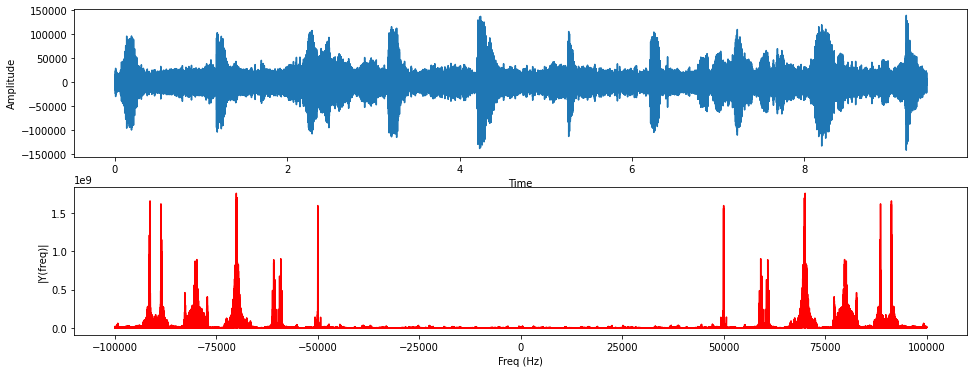

In [ ]:
filenameWave='/content/ENEE3309-2-2022/FDMAMixedAudio.wav' #wav file to filter
filenameWavefiltered='./Filtered.wav' # to save the filterd audio 
BWrange=100000 #bandwith range (you can change it to see the plot clearly)
################################################

write=1
read=1
rate, data = wavfile.read(filenameWave)
if len(data.shape) > 1:
   data=data[:,0]

filtereddata = np.fft.rfft(data, axis=0)

filteredwrite = np.fft.irfft(filtereddata, axis=0)
##############################################
## Generate Signal and add save it to text file
Fs=rate;
Ts = 1.0/Fs; # sampling interval
t = np.arange(0,len(data)*Ts,Ts) # time vector

y=[float(x) for x in data]
## Write values to a file
#Open new data file
if write!=0:
   f = open("Signal_in_text.txt", "w")
   for i in range(len(y)):
       f.write( str(y[i]) + " " + str(float(t[i])) + "\n"  )
   f.close()


## Read values from a file
if read !=0:
   with open('Signal_in_text.txt') as f:
      w=f.read()
   y=[];
   t=[];
   for x in w.split('\n'):
      if x != '':
         y.append(float(x.split()[0]))
         t.append(float(x.split()[1]))


n = len(y) # length of the signal
k = np.arange(n)
T = n/Fs
frq = k/T # two sides frequency range
fcen=frq[int(len(frq)/2)]
frq_DS=frq-fcen
frq_SS = frq[range(int(n/2))] # one side frequency range

Y = np.fft.fft(y) # fft computing and normalization
yinv= np.fft.ifft(Y).real # ifft computing and normalization
Y_DS=np.roll(Y,int(n/2))
Y_SS = Y[range(int(n/2))]

fcenIndex = (np.abs(frq_DS)).argmin()
RangeIndex = (np.abs(frq_DS-BWrange)).argmin() - fcenIndex

RangeIndexMin = fcenIndex-RangeIndex
if RangeIndexMin < 0:
  RangeIndexMin = 0

RangeIndexMax = fcenIndex+RangeIndex
if RangeIndexMax > len(frq_DS)-1:
  RangeIndexMax = len(frq_DS)-1

fig, ax = plt.subplots(2, 1,  figsize=(16, 6))
ax[0].plot(t,y)
ax[0].set_xlabel('Time')
ax[0].set_ylabel('Amplitude')
ax[1].set_xlabel('Freq (Hz)')
ax[1].set_ylabel('|Y(freq)|')
ax[1].plot(frq_DS[RangeIndexMin:RangeIndexMax],abs(Y_DS[RangeIndexMin:RangeIndexMax]),'r') # plotting the spectrum
ax[1].set_xlabel('Freq (Hz)')
ax[1].set_ylabel('|Y(freq)|')

plt.show()


## **5) Visually estimate the bandwidth and carrier frequencies of the specific signal to filter it**

### 5.1) enter the bandwith range [$−𝐵𝑊𝑟𝑎𝑛𝑔𝑒$, $𝐵𝑊𝑟𝑎𝑛𝑔𝑒$]

In [ ]:
B2 = int(input("BW :"))

BW :7000


### 5.1) enter the carrier frequencies (Fc)

In [ ]:
Fcr = int(input("Fc :"))

Fc :60000


## **6) demodulate audio signals from an FDMAsignal**

In [ ]:
write=1
read=1
rate, data = wavfile.read(filenameWave)
if len(data.shape) > 1:
   data=data[:,0]

filtereddata = np.fft.rfft(data, axis=0)
filteredwrite = np.fft.irfft(filtereddata, axis=0)
##############################################
## Generate Signal and add save it to text file
Fs=rate;
Ts = 1.0/Fs; # sampling interval
t = np.arange(0,len(data)*Ts,Ts) # time vector

y=[float(x) for x in data]
## Write values to a file
#Open new data file
if write!=0:
   f = open("Signal_in_text.txt", "w")
   for i in range(len(y)):
       f.write( str(y[i]) + " " + str(float(t[i])) + "\n"  )
   f.close()


## Read values from a file
if read !=0:
   with open('Signal_in_text.txt') as f:
      w=f.read()
   y=[];
   t=[];
   for x in w.split('\n'):
      if x != '':
         y.append(float(x.split()[0]))
         t.append(float(x.split()[1]))


n = len(y) # length of the signal
k = np.arange(n)
T = n/Fs
frq = k/T # two sides frequency range
fcen=frq[int(len(frq)/2)]
frq_DS=frq-fcen
frq_SS = frq[range(int(n/2))] # one side frequency range

Y = np.fft.fft(y) # fft computing and normalization
yinv= np.fft.ifft(Y).real # ifft computing and normalization
Y_DS=np.roll(Y,int(n/2))
Y_SS = Y[range(int(n/2))]

fcenIndex = (np.abs(frq_DS)).argmin()
RangeIndex = (np.abs(frq_DS-BWrange)).argmin() - fcenIndex

RangeIndexMin = fcenIndex-RangeIndex
if RangeIndexMin < 0:
  RangeIndexMin = 0

RangeIndexMax = fcenIndex+RangeIndex
if RangeIndexMax > len(frq_DS)-1:
  RangeIndexMax = len(frq_DS)-1


y=np.array(y)
y_int=y.astype(np.int16)

yinv=np.array(yinv)
yinv_int=yinv.astype(np.int16)


#demoudulation
yinv=yinv*np.cos(2*np.pi*Fcr*np.array(t))

yinv = np.fft.fft(yinv) # fft computing and normalization
yinv2= np.fft.ifft(yinv).real # ifft computing and normalization
Y_DS2=np.roll(yinv,int(n/2))



fBWIndex1 = (np.abs(frq_DS - B2)).argmin()
B2 = frq_DS[fBWIndex1]

Mask_DS1=np.ones(len(frq_DS))
Yf_DS1=np.copy(Y_DS2)
Bmax=frq_DS[len(frq_DS)-1]
Bmin=0
Bold=0

Yf_DS1=np.copy(Y_DS2)
for cnt in range(len(frq_DS)):
  if ~(((frq_DS[cnt])>-1*B2) and ((frq_DS[cnt])<B2)):
    Mask_DS1[cnt]=0;
    #print(B,frq_DS[cnt],Yf_DS[cnt])
    Yf_DS1[cnt]=Y_DS2[cnt]*0;


Yf=np.roll(Yf_DS1,int(n/2))
yinv2= np.fft.ifft(Yf).real # ifft computing and normalization
yinv2=np.array(yinv2)
yinv_int=yinv2.astype(np.int16)

wavfile.write(filenameWavefiltered, rate, yinv_int)

## **7) Plot the filterd signal of the audio signals in the time and frequency domain**

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


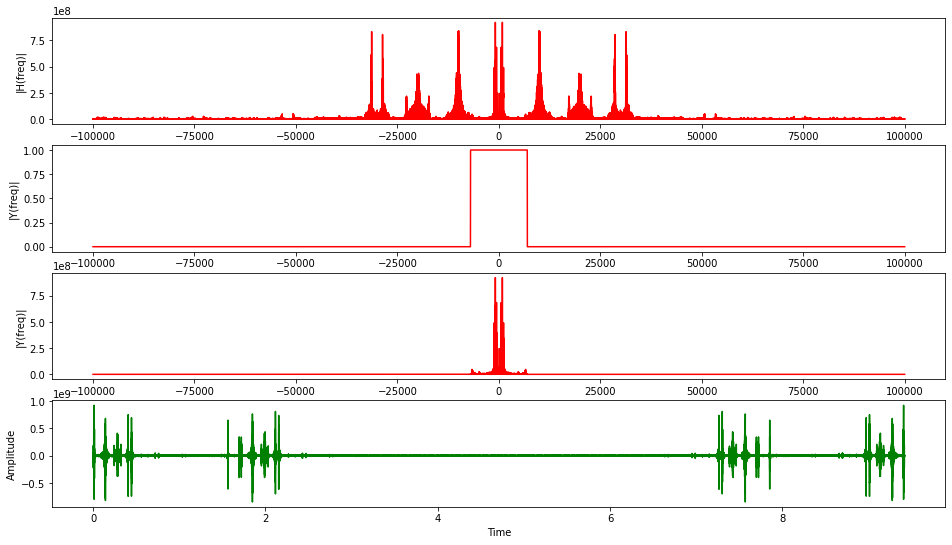

In [ ]:
fig, ax = plt.subplots(4, 1,  figsize=(16, 9))

ax[0].set_xlabel('Freq (Hz)')
ax[0].set_ylabel('|H(freq)|')
ax[0].plot(frq_DS[RangeIndexMin:RangeIndexMax],abs(Y_DS2[RangeIndexMin:RangeIndexMax]),'r') # plotting the spectrum

ax[1].set_xlabel('Freq (Hz)')
ax[1].set_ylabel('|MASK|')
ax[1].plot(frq_DS[RangeIndexMin:RangeIndexMax],abs(Mask_DS1[RangeIndexMin:RangeIndexMax]),'r') # plotting the spectrum

ax[2].set_xlabel('Freq (Hz)')
ax[2].set_ylabel('|Y(freq)|')
ax[2].plot(frq_DS[RangeIndexMin:RangeIndexMax],abs(Yf_DS1[RangeIndexMin:RangeIndexMax]),'r') # plotting the spectrum


ax[3].set_xlabel('Time')
ax[3].set_ylabel('Amplitude')
ax[3].plot(t,yinv,'g') # plotting the spectrum

plt.show()

## **8) Play the demodulated audio signals**

In [ ]:
from IPython.display import Audio
# Generate a player for mono sound
Audio(yinv2,rate=rate)